#### Import Libraries & Load Data

In [2]:
# !pip install pandas
# !pip install  numpy
# !pip install plotly
# !pip install osmnx networkx
#!pip install statsmodels seaborn matplotlib patsy geopandas
#!pip install networkx

In [3]:
import pandas as pd
import numpy as np
# import osmnx as ox
import networkx as nx
import plotly.express as px
import plotly.graph_objects as go
import geopandas as gpd
from shapely.geometry import Point, LineString, MultiLineString
# from custom_functions import *
from itertools import product


In [4]:
# from patsy import dmatrices
import matplotlib.pyplot as plt



In [5]:
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=FutureWarning)


In [6]:
import os
import platform

def get_data_folder_path():
    # Get the current operating system
    os_type = platform.system()
    user_name = os.getlogin()

    # Define data folder paths for different systems
    if os_type == 'Windows' and user_name == 'Alice':
        data_folder_path = f"C:\\Users\\{user_name}\\Documents\\Data"
    elif os_type == 'Linux' and user_name == 'salathem':
        data_folder_path = '/cluster/home/salathem/Programming/data/'
    elif os_type == 'Darwin':
        data_folder_path = '/Users/Marco/Library/CloudStorage/OneDrive-Persönlich/ETHZ/Agent Based Modeling/data/'
    else:
        raise Exception("Unsupported system configuration")

    return data_folder_path


In [7]:
data_path = get_data_folder_path()
microzensus_data_folder = data_path +'microzensus/'
# Read CSV files
data_folder = microzensus_data_folder

In [8]:


df_personen = pd.read_csv(data_folder + 'zielpersonen.csv', sep=";", encoding='ISO-8859-1')
df_hh = pd.read_csv(data_folder + 'haushalte.csv', sep=";", encoding='ISO-8859-1')
df_wegeInland = pd.read_csv(data_folder + 'wegeinland.csv', sep=";", encoding='ISO-8859-1')

# Full join df_wegeInland and df_personen on columns 'HHNR' and 'WP'
df_wegeInland_zp = pd.merge(df_wegeInland, df_personen, on=['HHNR', 'WP'], how='outer')

# Full join df_wegeInland and df_hh on column 'HHNR'
df_wegeInland_hh = pd.merge(df_wegeInland, df_hh, on='HHNR', how='outer')

# Replace weight in df_wegeInland_hh with the weight from the df_hh dataframe
df_wegeInland_hh = df_wegeInland_hh.drop(columns=['WP'])
df_wegeInland_hh = pd.merge(df_wegeInland_hh, df_personen[['HHNR', 'WP']], on='HHNR', how='left')

# Full join df_wegeInland_zp and df_hh on column 'HHNR'
df_wegeInland_hh_zp = pd.merge(df_wegeInland_zp, df_hh, on='HHNR', how='outer')
df_hh_zp = pd.merge(df_hh, df_personen, on='HHNR', how='inner')
# Perform full joins
# df_wegeInland_zp = df_wegeInland.merge(df_personen, on=["HHNR", "WP"], how="outer")
# df_wegeInland_hh = df_wegeInland.merge(df_hh, on="HHNR", how="outer")

KeyError: 'HHNR'

#### Custom Functions

In [ ]:
def plot_shapefile(gdf, width=None, height=None):
    
    
    # Ensure the coordinate reference system is EPSG:4326
    if gdf.crs != "EPSG:4326":
        gdf = gdf.to_crs("EPSG:4326")

    # Convert geometry to GeoJSON format
    geojson = gdf.geometry.__geo_interface__

    # Create a unique identifier for each feature/row
    gdf['id'] = gdf.index.astype(str)

    # Create the plot with Plotly
    fig = px.choropleth_mapbox(gdf, 
                                geojson=geojson,
                                locations='id',
                                hover_name='id',
                                title='Zurich Districts',
                                mapbox_style="open-street-map",
                                center={"lat": gdf.geometry.centroid.y.mean(), "lon": gdf.geometry.centroid.x.mean()},
                                zoom=10,
                                opacity=0.5)

    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    
    # Update the layout to set the width and height
    if width is not None and height is not None:
        fig.update_layout(width=width, height=height)
    
    fig.show()

## Assignment 1

### Task 1: Mobility by the household location type

In [ ]:
# Group by W_DEGURBA and calculate the weighted mean of 'T_WEGE' and 'rdist_sum_Inland' using 'WM' as weights
df_hh_zp_weighted_avg = df_hh_zp.groupby('W_DEGURBA').apply(lambda x: pd.Series({
    'Weighted_Average_T_WEGE': np.average(x['T_WEGE'], weights=x['WP']),
    'Weighted_Average_rdist_sum_Inland': np.average(x['rdist_sum_Inland'], weights=x['WP'])
})).reset_index()
# Rename 'W_DEGURBA' values
df_hh_zp_weighted_avg['W_DEGURBA'] = df_hh_zp_weighted_avg['W_DEGURBA'].map({1: 'Cities', 2: 'Smaller Cities', 3: 'Countryside'})

df_hh_zp_weighted_avg


,W_DEGURBA,Weighted_Average_T_WEGE,Weighted_Average_rdist_sum_Inland
0,Cities,2.781450,24.265808
1,Smaller Cities,2.747394,31.615441
2,Countryside,2.720237,34.841660


In [ ]:
# Group by 'Tag' and calculate the weighted mean of 'T_WEGE' using 'WP' as weights
df_avg_trips_per_weekday = df_hh_zp.groupby('Tag').apply(lambda x: np.average(x['T_WEGE'], weights=x['WP'])).reset_index()

# Rename the columns
df_avg_trips_per_weekday.columns = ['Weekday', 'Weighted_Average_T_WEGE']

# Replace numeric weekdays with names
weekday_mapping = {1: 'Monday', 2: 'Tuesday', 3: 'Wednesday', 4: 'Thursday', 5: 'Friday', 6: 'Saturday', 7: 'Sunday'}
df_avg_trips_per_weekday['Weekday'] = df_avg_trips_per_weekday['Weekday'].map(weekday_mapping)

df_avg_trips_per_weekday

,Weekday,Weighted_Average_T_WEGE
0,Monday,2.887563
1,Tuesday,3.041049
2,Wednesday,2.995486
3,Thursday,2.968949
4,Friday,3.050817
5,Saturday,2.588040
6,Sunday,1.755393


In [ ]:
# Filter rows where WP is not NaN
df_T1_avgtrips_ByHHDEGURBA = df_wegeInland_hh.dropna(subset=['WP'])

# Group by W_DEGURBA, HHNR, and WP, calculate the max of WEGNR
df_T1_avgtrips_ByHHDEGURBA = df_T1_avgtrips_ByHHDEGURBA.groupby(['W_DEGURBA', 'HHNR', 'WP'])['WEGNR'].max().reset_index()

# Replace NaN values in 'trips' column with 0
df_T1_avgtrips_ByHHDEGURBA['WEGNR'] = df_T1_avgtrips_ByHHDEGURBA['WEGNR'].fillna(0)

# Group by W_DEGURBA and calculate the weighted mean of 'trips' using 'WP' as weights
df_T1_avgtrips_ByHHDEGURBA = df_T1_avgtrips_ByHHDEGURBA.groupby('W_DEGURBA').apply(lambda x: np.average(x['WEGNR'], weights=x['WP'])).reset_index()

# Rename 'W_DEGURBA' values
df_T1_avgtrips_ByHHDEGURBA['W_DEGURBA'] = df_T1_avgtrips_ByHHDEGURBA['W_DEGURBA'].map({1: 'Cities', 2: 'Smaller Cities', 3: 'Countryside'})
df_T1_avgtrips_ByHHDEGURBA.columns = ['W_DEGURBA', 'tripsByHH']

# Display the resulting dataframe
df_T1_avgtrips_ByHHDEGURBA

,W_DEGURBA,tripsByHH
0,Cities,2.788262
1,Smaller Cities,2.750802
2,Countryside,2.723558


### Task 2: Average distance traveled by individual by urbanization degree

In [ ]:

df_T2_avgdist_ByHHDEGURBA = df_wegeInland_hh[~df_wegeInland_hh['WP'].isna()] \
    .groupby(['W_DEGURBA', 'HHNR', 'WP'])['w_rdist'].sum() \
    .groupby('W_DEGURBA').apply(lambda x: np.average(x, weights=x.index.get_level_values('WP'))) \
    .reset_index()
df_T2_avgdist_ByHHDEGURBA['W_DEGURBA'] = df_T2_avgdist_ByHHDEGURBA['W_DEGURBA'].map({1: 'Cities', 2: 'Smaller Cities', 3: 'Countryside'})
df_T2_avgdist_ByHHDEGURBA

,W_DEGURBA,w_rdist
0,Cities,24.035091
1,Smaller Cities,31.450025
2,Countryside,34.551491


### Task 3: Average number of trips per weekday

In [ ]:
# Filter rows where WP is not NaN
df_T3_avgtrips_ByHHDAY = df_wegeInland_zp.dropna(subset=['WP'])

# Group by W_DEGURBA, HHNR, and WP, calculate the max of WEGNR
df_T3_avgtrips_ByHHDAY = df_T3_avgtrips_ByHHDAY.groupby(['Tag', 'HHNR', 'WP'])['WEGNR'].max().reset_index()

# Replace NaN values in 'trips' column with 0
df_T3_avgtrips_ByHHDAY['WEGNR'] = df_T3_avgtrips_ByHHDAY['WEGNR'].fillna(0)

# Group by W_DEGURBA and calculate the weighted mean of 'trips' using 'WP' as weights
df_T3_avgtrips_ByHHDAY = df_T3_avgtrips_ByHHDAY.groupby('Tag').apply(lambda x: np.average(x['WEGNR'], weights=x['WP'])).reset_index()

# Rename 'W_DEGURBA' values
df_T3_avgtrips_ByHHDAY['Tag'] = df_T3_avgtrips_ByHHDAY['Tag'].map({1: 'Monday', 2: 'Tuesday', 3: 'Wednesday', 4: 'Thursday', 5: 'Friday', 6: 'Saturday', 7: 'Sunday'})
df_T3_avgtrips_ByHHDAY.columns = ['Tag', 'tripsByDay']

# Create the bar plot using Plotly Express
fig = px.bar(df_T3_avgtrips_ByHHDAY, x='Tag', y='tripsByDay', labels={'tripsByDay': 'Average number of trips'},
             title='Average Number of Trips by Weekday')
# Update the layout to set the width and height
fig.update_layout(width=1200, height=800)
# Show the plot
fig.show()

# Display the resulting dataframe
df_T3_avgtrips_ByHHDAY

,Tag,tripsByDay
0,Monday,2.891203
1,Tuesday,3.045982
2,Wednesday,3.000395
3,Thursday,2.973111
4,Friday,3.052471
5,Saturday,2.592239
6,Sunday,1.762683


In [ ]:
# Group by 'Tag' and calculate the weighted mean of 'T_WEGE' using 'WP' as weights
df_avg_trips_per_weekday = df_hh_zp.groupby('Tag').apply(lambda x: np.average(x['T_WEGE'], weights=x['WP'])).reset_index()

# Rename the columns
df_avg_trips_per_weekday.columns = ['Weekday', 'Weighted_Average_T_WEGE']

# Replace numeric weekdays with names
weekday_mapping = {1: 'Monday', 2: 'Tuesday', 3: 'Wednesday', 4: 'Thursday', 5: 'Friday', 6: 'Saturday', 7: 'Sunday'}
df_avg_trips_per_weekday['Weekday'] = df_avg_trips_per_weekday['Weekday'].map(weekday_mapping)





# Plotting
fig = px.bar(df_avg_trips_per_weekday, 
             x='Weekday', 
             y='Weighted_Average_T_WEGE', 
             title='Average Number of Trips per Weekday',
             labels={'Weighted_Average_T_WEGE': 'Weighted Average Trips'},
             color_continuous_scale='Viridis')
fig.update_layout(width=1200, height=800)
fig.show()

df_avg_trips_per_weekday

,Weekday,Weighted_Average_T_WEGE
0,Monday,2.887563
1,Tuesday,3.041049
2,Wednesday,2.995486
3,Thursday,2.968949
4,Friday,3.050817
5,Saturday,2.588040
6,Sunday,1.755393


### Task 4: Traveled distances by individual by household income

In [ ]:
df_T4_avgdist_ByIncome = df_wegeInland_hh[(df_wegeInland_hh['f20601'] >= 0) & (df_wegeInland_hh['w_rdist'] >= 0) & ~df_wegeInland_hh['WP'].isna()] \
    .groupby(['f20601', 'HHNR', 'WP'])['w_rdist'].sum() \
    .groupby('f20601').apply(lambda x: np.average(x, weights=x.index.get_level_values('WP'))) \
    .reset_index()
df_T4_avgdist_ByIncome['f20601'] = df_T4_avgdist_ByIncome['f20601'].map({
    1: 'Below CHF 2000', 2: 'CHF 2000 to 4000', 3: 'CHF 4001 to 6000',
    4: 'CHF 6001 to 8000', 5: 'CHF 8001 to 10000', 6: 'CHF 10001 to 12000',
    7: 'CHF 12001 to 14000', 8: 'CHF 14001 to 16000', 9: 'More than CHF 16000'
})


In [ ]:
fig = px.bar(df_T4_avgdist_ByIncome, x='f20601', y='w_rdist', labels={'w_rdist': 'Average distance traveled by individual', 'f20601': 'Income'}, title='Average Distance Traveled by Individual by Household Income')
# Update the layout to set the width and height
fig.update_layout(width=1200, height=800)
fig.show()

### Task 5

In [ ]:
#noting

### Task 6: Mode share by trip purpose

In [ ]:
df_wegeInland_hh['wmittel2a']

0         2.0
1         2.0
2         2.0
3         2.0
4         2.0
         ... 
160022    NaN
160023    NaN
160024    NaN
160025    NaN
160026    NaN
Name: wmittel2a, Length: 160027, dtype: float64

In [ ]:
# Filter the data, calculate counts, and percentages
# df_wegeInland_hh = df_wegeInland.merge(df_hh, on="HHNR", how="outer")
# df_modeSharec_zweck = df_wegeInland_hh[(df_wegeInland_hh['wmittel2a'] >= 0) & (df_wegeInland_hh['wzweck3'] >= 0)] \
#     .groupby(['wzweck3', 'wmittel2a'])['w_rdist'].sum() * df_wegeInland_hh.groupby(['wzweck3', 'wmittel2a'])['WP'].mean()
# df_modeSharec_zweck = df_modeSharec_zweck.unstack().fillna(0)
# df_modeSharec_zweck['total_count'] = df_modeSharec_zweck.sum(axis=1)
# df_modeSharec_zweck = df_modeSharec_zweck.reset_index()
# df_modeSharec_zweck['percentage'] = df_modeSharec_zweck.apply(
#     lambda row: (row[row['wmittel2a'] == "Motorized individual (%)"] / row['total_count']) * 100, axis=1
# )
# df_modeSharec_zweck['wzweck3'] = df_modeSharec_zweck['wzweck3'].map({
#     1: 'Mode change', 2: 'Work', 3: 'Education', 4: 'Shopping', 5: 'Errands', 6: 'Business activity',
#     7: 'Service trip', 8: 'Leisure activities', 9: 'Accompanying path (children)', 10: 'Accompanying path (others)',
#     11: 'Return home', 12: 'Others', 13: 'Border crossing'
# })
# df_modeSharec_zweck['wzweck3'] = pd.Categorical(df_modeSharec_zweck['wzweck3'],
#                                                categories=['Mode change', 'Work', 'Education', 'Shopping',
#                                                            'Errands', 'Business activity', 'Service trip',
#                                                            'Leisure activities', 'Accompanying path (children)',
#                                                            'Accompanying path (others)', 'Return home', 'Others',
#                                                            'Border crossing'], ordered=True)

# df_modeSharec_zweck['wmittel2a'] = df_modeSharec_zweck['wmittel2a'].map({
#     1: 'Slow traffic', 2: 'Motorized individual (%)', 3: 'Public transport', 4: 'Others'
# })
# df_modeSharec_zweck['wmittel2a'] = pd.Categorical(df_modeSharec_zweck['wmittel2a'],
#                                                   categories=['Slow traffic', 'Motorized individual (%)',
#                                                               'Public transport', 'Others'], ordered=True)

# # Create the stacked bar plot using Plotly Express
# fig = px.bar(df_modeSharec_zweck, x='wzweck3', y=df_modeSharec_zweck.columns[1:-2], title='Mode Share by Trip Purpose',
#              labels={'wzweck3': 'Trip Purpose'}, text='percentage')
# fig.update_traces(texttemplate='%{text:.2s}%')
# fig.update_layout(barmode='stack')
# fig.show()


# Assignment 2

In [ ]:
df_zp = pd.read_csv(data_folder + 'zielpersonen.csv', sep=";", encoding='ISO-8859-1')
df_hh = pd.read_csv(data_folder + 'haushalte.csv', sep=";", encoding='ISO-8859-1')
df_wegeInland = pd.read_csv(data_folder + 'wegeinland.csv', sep=";", encoding='ISO-8859-1')

### Task 1

In [ ]:
df_noTrips = df_hh[~df_hh['HHNR'].isin(df_wegeInland['HHNR'])].copy()
df_noTrips['trips'] = 0
df_noTrips = df_noTrips[['HHNR', 'trips']]

df_trips = df_wegeInland.groupby('HHNR').agg({'WEGNR': 'max'}).reset_index().rename(columns={'WEGNR': 'trips'})
df_trips = pd.concat([df_trips, df_noTrips], ignore_index=True)
df_trips = df_trips.merge(df_hh, on='HHNR', how='left').merge(df_zp, on='HHNR', how='left')

# Filter and mutate operations
df_trips = df_trips[df_trips[['f20601', 'Tag', 'f20400a', 'f41600_01a', 'f41600_01b', 'f41600_01c', 'ESTATUS']].gt(0).all(1)]
df_trips = df_trips.query("f20601 > 0 & Tag < 6 & f20400a > 0 & f41600_01a > 0 & f41600_01b > 0 & f41600_01c > 0 & ESTATUS > 0")


# Mutate operations
df_trips['Income (CHF)'] = pd.Categorical(np.select(
    [df_trips['f20601'] == i for i in range(1, 10)],
    ['<2000', '2000-4000', '4000-6000', '6000-8000', '8000-10000', '10000-12000', '12000-14000', '14000-16000', '>16000']
))

df_trips['GA'] = np.where(df_trips['f41600_01a'] == 1, 'Yes', 'No')
df_trips['Halbtax'] = np.where(df_trips['f41600_01b'] == 1, 'Yes', 'No')
df_trips['Regional Abo'] = np.where(df_trips['f41600_01c'] == 1, 'Yes', 'No')
df_trips['Driving licence'] = np.where(df_trips['f20400a'] == 1, 'Yes', 'No')

df_trips['PT Access'] = pd.Categorical(np.select(
    [df_trips['W_OEV_KLASSE'] == i for i in range(1, 6)],
    ['Class A: Very good access', 'Class B: Good access', 'Class C: Medium access', 'Class D: Poor access', 'Marginal or no access']
))

df_trips['ESTATUS'] = df_trips['ESTATUS'].astype('category')

# Create a new column
df_trips['inverse_trips'] = 1 / (df_trips['trips'] + 1)

In [ ]:
list(df_trips)

['HHNR',
 'trips',
 'WM',
 'DMOD_x',
 'intwdate',
 'sprache_x',
 'ZEIT_HH',
 'W_X',
 'W_Y',
 'W_QAL',
 'W_BFS',
 'W_PLZ',
 'W_ORT',
 'W_STR',
 'W_HNR',
 'W_SPRACHE',
 'W_REGION',
 'W_KANTON',
 'W_ISO_Staedte_MIV',
 'W_ISO_Staedte_OeV',
 'W_OEV_KLASSE',
 'W_AGGLO2012',
 'W_AGGLO_GROESSE2012',
 'W_staedt_char_2012',
 'W_stat_stadt_2012',
 'W_stadt_land_2012',
 'W_DEGURBA',
 'bewohn',
 'f10700',
 'f10800',
 'ZW1_f11100',
 'ZW1_f11500',
 'ZW1_f11200',
 'ZW1_f11300',
 'ZW1_X',
 'ZW1_Y',
 'ZW1_QAL',
 'ZW1_BFS',
 'ZW1_PLZ',
 'ZW1_ORT',
 'ZW1_STR',
 'ZW1_HNR',
 'ZW1_LND',
 'ZW2_f11100',
 'ZW2_f11500',
 'ZW2_f11200',
 'ZW2_f11300',
 'ZW2_X',
 'ZW2_Y',
 'ZW2_QAL',
 'ZW2_BFS',
 'ZW2_PLZ',
 'ZW2_ORT',
 'ZW2_STR',
 'ZW2_HNR',
 'ZW2_LND',
 'ZW3_f11100',
 'ZW3_f11500',
 'ZW3_f11200',
 'ZW3_f11300',
 'ZW3_X',
 'ZW3_Y',
 'ZW3_QAL',
 'ZW3_BFS',
 'ZW3_PLZ',
 'ZW3_ORT',
 'ZW3_STR',
 'ZW3_HNR',
 'ZW3_LND',
 'hhtyp',
 'hhgr',
 'f30100',
 'f31100',
 'f31200',
 'f31900',
 'f32000',
 'f32100',
 'f32200a',
 'f3

                            OLS Regression Results                            
Dep. Variable:          inverse_trips   R-squared:                       0.063
Model:                            OLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     66.55
Date:                Fri, 03 Nov 2023   Prob (F-statistic):               0.00
Time:                        16:08:50   Log-Likelihood:                -2860.0
No. Observations:               26782   AIC:                             5776.
Df Residuals:                   26754   BIC:                             6005.
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

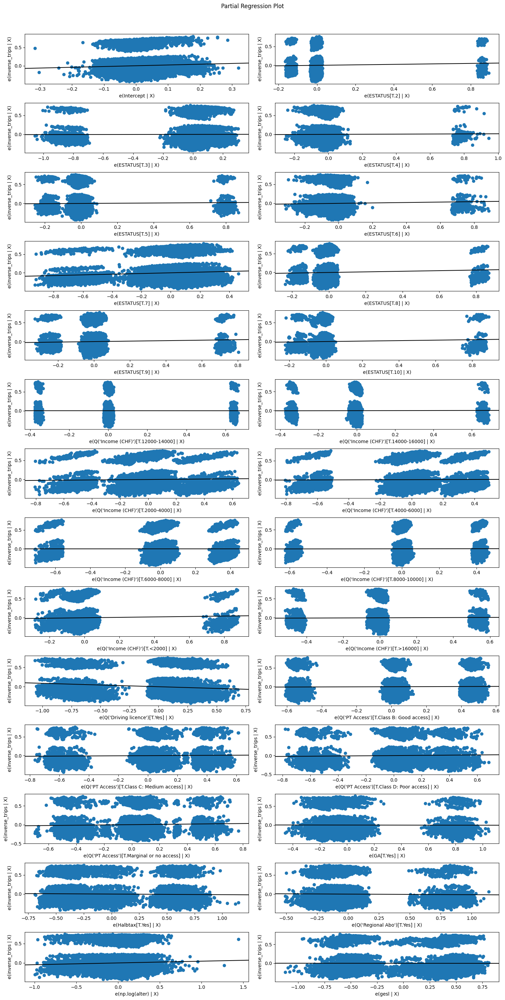

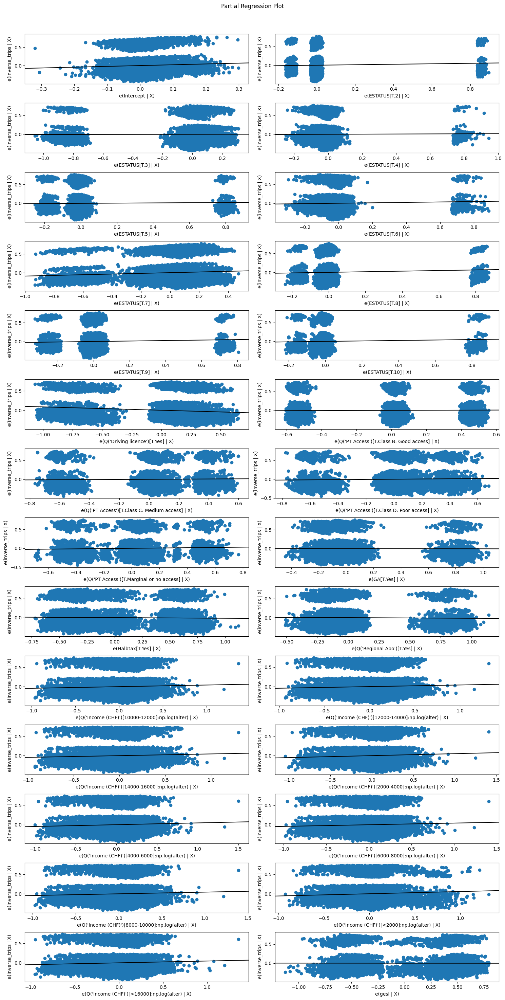

In [ ]:
# Linear regression models
lm_trips = smf.ols("inverse_trips ~ ESTATUS + Q('Income (CHF)') + np.log(alter) + gesl + Q('Driving licence') + Q('PT Access') + GA + Halbtax + Q('Regional Abo')", data=df_trips).fit()
print(lm_trips.summary())

# Adjust figure size and font size for better readability
fig = plt.figure(figsize=(15, 30))
plt.subplots_adjust(hspace=2.2)  # Adjust space between plots
smg.plot_partregress_grid(lm_trips, fig=fig)
plt.show()

lm_trips2 = smf.ols("inverse_trips ~ ESTATUS + Q('Income (CHF)'):np.log(alter) + gesl + Q('Driving licence') + Q('PT Access') + GA + Halbtax + Q('Regional Abo')", data=df_trips).fit()

# Adjust figure size and font size for better readability
fig = plt.figure(figsize=(15, 30))
plt.subplots_adjust(hspace=2.2)  # Adjust space between plots
smg.plot_partregress_grid(lm_trips2, fig=fig)
plt.show()

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  trips   No. Observations:                26782
Model:                            GLM   Df Residuals:                    26754
Model Family:                 Poisson   Df Model:                           27
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -56508.
Date:                Fri, 03 Nov 2023   Deviance:                       43762.
Time:                        16:09:29   Pearson chi2:                 3.80e+04
No. Iterations:                     5   Pseudo R-squ. (CS):            0.09538
Covariance Type:            nonrobust                                         
                                               coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

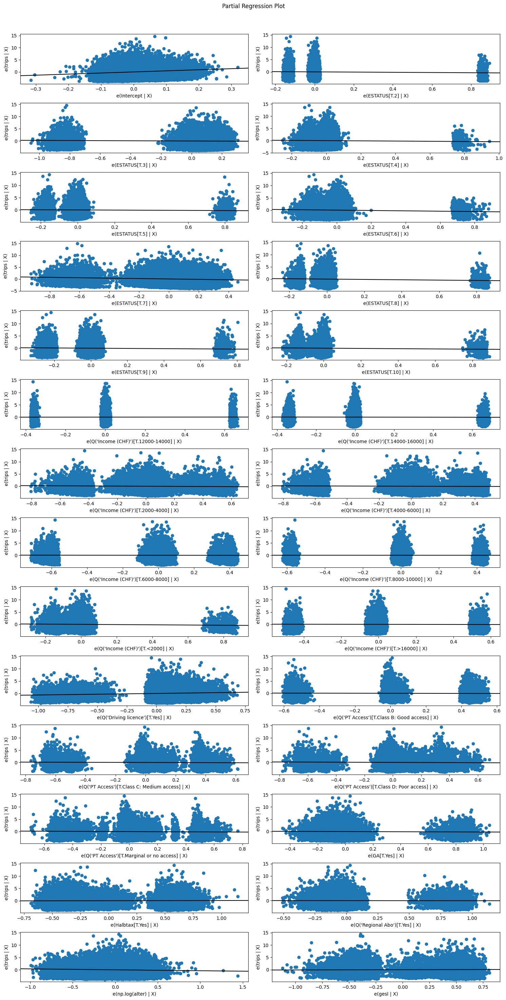

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  trips   No. Observations:                26782
Model:                            GLM   Df Residuals:                    26754
Model Family:        NegativeBinomial   Df Model:                           27
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -60050.
Date:                Fri, 03 Nov 2023   Deviance:                       15295.
Time:                        16:09:48   Pearson chi2:                 9.76e+03
No. Iterations:                     6   Pseudo R-squ. (CS):            0.02637
Covariance Type:            nonrobust                                         
                                               coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [ ]:
# Poisson regression models
poisson_trips = smf.glm("trips ~ ESTATUS + Q('Income (CHF)') + np.log(alter) + gesl + Q('Driving licence') + Q('PT Access') + GA + Halbtax + Q('Regional Abo')", data=df_trips, family=sm.families.Poisson()).fit()
print(poisson_trips.summary())

# Adjust figure size and spacing for better readability
fig = plt.figure(figsize=(15, 30))
plt.subplots_adjust(hspace=2.2)
smg.plot_partregress_grid(poisson_trips, fig=fig)
plt.show()

# Negative Binomial regression models
nb_trips = smf.glm("trips ~ ESTATUS + Q('Income (CHF)') + np.log(alter) + gesl + Q('Driving licence') + Q('PT Access') + GA + Halbtax + Q('Regional Abo')", data=df_trips, family=sm.families.NegativeBinomial()).fit()
print(nb_trips.summary())

nb_trips2 = smf.glm("trips ~ ESTATUS + Q('Income (CHF)') + np.log(alter) + gesl + Q('Driving licence') + Q('PT Access') + GA + Halbtax + Q('Regional Abo')", data=df_trips, family=sm.families.NegativeBinomial()).fit()
print(nb_trips2.summary())

# ANOVA
# print(sm.stats.anova_lm(nb_trips, nb_trips2))

# Unique values
print(df_trips['Income (CHF)'].unique())

In [ ]:
# Assuming df_trips is your original DataFrame
df_trips['f32200'] = df_trips['f32200a'] + df_trips['f32200b'] + df_trips['f32200c']

# Define conditions
conditions = [
    ((df_trips['f20400a'] == 1) | (df_trips['f20400b'] == 1)),
    ((df_trips['f20400a'] == 2) | (df_trips['f20400b'] == 2)) & ~((df_trips['f20400a'] == 1) | (df_trips['f20400b'] == 1)),
    ((df_trips['f20400a'] == -99) & (df_trips['f20400b'] == -99)),
    ((df_trips['f20400a'] == -98) & (df_trips['f20400b'] == -98)),
    ((df_trips['f20400a'] == -97) & (df_trips['f20400b'] == -97))
]

# Define corresponding values
values = [1, 2, 99, 98, 97]

# Create new column
df_trips['f20400'] = np.select(conditions, values, default=-98)

selected_columns = ['trips', 'W_OEV_KLASSE', 'W_DEGURBA', 'f30100', 'f32200', 'f20601', 'alter', 'gesl', 'Tag', 'f20400', 'zivil', 'T_ETAPPEN',
                    'T_WEGE', 'T_WEGZEIT', 'Income (CHF)', 'GA', 'Halbtax',
                    'Regional Abo', 'Driving licence', 'PT Access']

# Create a new DataFrame with only the selected columns
df_selected = df_trips[selected_columns]

# Define the non-numeric columns for which you want to create dummy variables
selected_columns_non_numeric = ['Income (CHF)', 'GA', 'Halbtax', 'Regional Abo', 'Driving licence', 'PT Access']

# Create dummy variables for the selected columns
df_dummies = pd.get_dummies(df_selected[selected_columns_non_numeric], prefix=selected_columns_non_numeric, drop_first=True)

# Concatenate the original DataFrame with the dummy variables
df_trips_extended = pd.concat([df_selected, df_dummies], axis=1)

# Remove the original non-numeric columns
df_trips_extended = df_trips_extended.drop(columns=selected_columns_non_numeric)


In [ ]:
df = df_trips_extended.iloc[:, 1:12]
df

,W_OEV_KLASSE,W_DEGURBA,f30100,f32200,f20601,alter,gesl,Tag,f20400,zivil,T_ETAPPEN
0,3,2,2,0,5,57,1,4,1,4,7
1,2,2,1,1,3,57,1,2,1,2,4
4,3,2,0,1,2,53,2,2,1,1,12
5,3,3,3,3,6,61,1,3,1,2,2
7,4,2,1,3,6,43,1,1,1,2,4
...,...,...,...,...,...,...,...,...,...,...,...
54993,3,2,1,2,6,55,1,5,1,2,0
55001,1,1,1,0,3,90,1,3,1,2,0
55003,4,2,1,7,8,54,1,2,1,2,0
55005,1,1,0,2,2,52,2,2,2,2,0


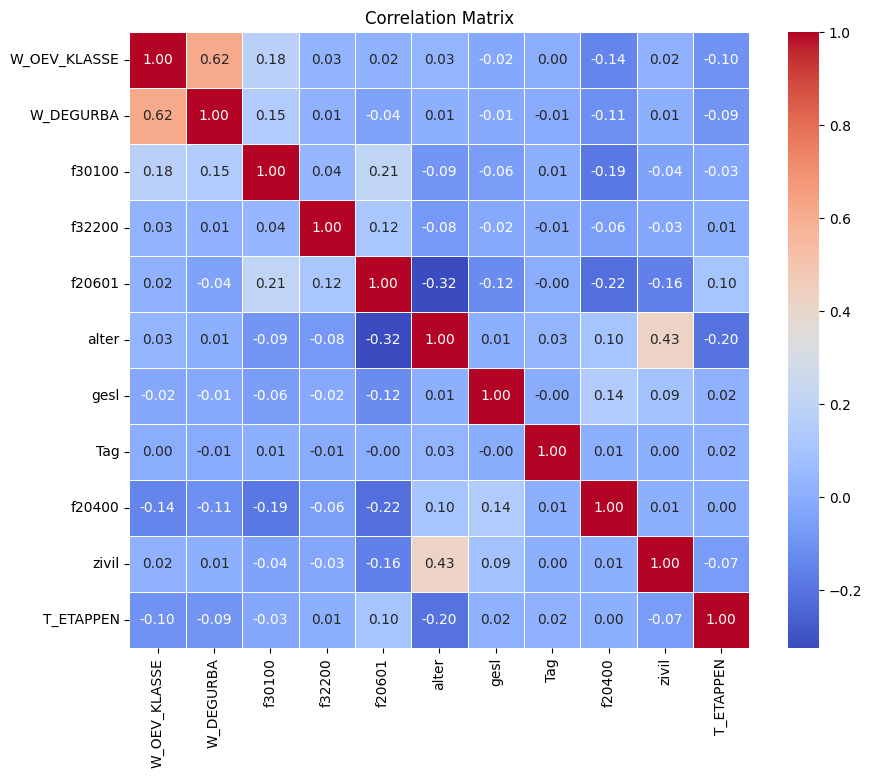

In [ ]:
# Compute the correlation matrix
corr_matrix = df.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)
plt.title("Correlation Matrix")
plt.show()

### Task 2

### Task 3

### Task 4

### Task 5

### Task 6

### Task 7

### Task 8

# Assignment 3

## Part 1 - Trip Distribution

### Task 1

First, read in the necessary data. Read in the zones in shapefile format with R (read_sf function from the “sf” package) as well as the trips file.

In [ ]:
import os
import platform

def get_data_folder_path():
    # Get the current operating system
    os_type = platform.system()
    user_name = os.getlogin()

    # Define data folder paths for different systems
    if os_type == 'Windows' and user_name == 'Alice':
        data_folder_path = f"C:\\Users\\{user_name}\\Documents\\Data"
    elif os_type == 'Linux' and user_name == 'salathem':
        data_folder_path = '/cluster/home/salathem/Programming/data/'
    elif os_type == 'Darwin':
        data_folder_path = '/Users/Marco/Library/CloudStorage/OneDrive-Persönlich/ETHZ/Agent Based Modeling/data/'
    else:
        raise Exception("Unsupported system configuration")

    return data_folder_path
data_path = get_data_folder_path()

In [ ]:
data_path

'/Users/Marco/Library/CloudStorage/OneDrive-Persönlich/ETHZ/Agent Based Modeling/data/'

In [ ]:
df_personen = pd.read_csv(data_path + 'microzensus/zielpersonen.csv', encoding='ISO-8859-1')
df_wegeInland = pd.read_csv(data_path + 'microzensus/wegeinland.csv', encoding='ISO-8859-1')
npvm_zones = gpd.read_file(data_path + 'scenarios/Zurich/data/NPVM2010MetroZH.shp').to_crs("EPSG:4326")
gdf_boundary = gpd.read_file(data_path + 'scenarios/Zurich/ScenarioBoundary/zurich_city_5km.shp').to_crs("EPSG:4326")

In [ ]:
npvm_zones

,row_id,ID_Zo,N_Zo,ID_Typ,ID_Kt,N_Kt,ID_A00_9,N_A00_9,ID_B00_9,N_B00_9,...,N_Ms00,ID_Rp00,N_Rp00,ID_Bez,N_Bez,ID_Greg00,N_Greg00,ZoneVZA,ZonePop,geometry
0,1,1,Aeugst am Albis,1,1,ZH,3,Gürtel der Grosszentren,4,Periurbane Gemeinden (PERI),...,Knonaueramt,105,Knonaueramt,101,Bezirk Affoltern,4,Zürich,314.087029,1308,"POLYGON ((8.47730 47.28890, 8.47775 47.28900, ..."
1,2,2,Affoltern am Albis,1,1,ZH,2,Nebenzentren der Grosszentren,2,Suburbane Gemeinden (SUB),...,Knonaueramt,105,Knonaueramt,101,Bezirk Affoltern,4,Zürich,5186.270790,7766,"POLYGON ((8.41466 47.29360, 8.41496 47.29374, ..."
2,3,3,Bonstetten,1,1,ZH,3,Gürtel der Grosszentren,4,Periurbane Gemeinden (PERI),...,Knonaueramt,105,Knonaueramt,101,Bezirk Affoltern,4,Zürich,889.545489,3407,"POLYGON ((8.45412 47.33475, 8.45481 47.33476, ..."
3,4,5,Hedingen,1,1,ZH,3,Gürtel der Grosszentren,4,Periurbane Gemeinden (PERI),...,Knonaueramt,105,Knonaueramt,101,Bezirk Affoltern,4,Zürich,1217.274744,2378,"POLYGON ((8.42855 47.30115, 8.42874 47.30136, ..."
4,5,7,Knonau,1,1,ZH,3,Gürtel der Grosszentren,4,Periurbane Gemeinden (PERI),...,Knonaueramt,105,Knonaueramt,101,Bezirk Affoltern,4,Zürich,384.237320,1474,"POLYGON ((8.43792 47.24358, 8.43793 47.24358, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138,139,26108,Zürich Kreis 8,0,1,ZH,1,Grosszentren,1,Zentren (CEN),...,Zürich,101,Stadt Zürich,112,Bezirk Zürich,4,Zürich,26637.011611,12205,"POLYGON ((8.54572 47.36415, 8.54587 47.36421, ..."
139,140,26109,Zürich Kreis 9,0,1,ZH,1,Grosszentren,1,Zentren (CEN),...,Zürich,101,Stadt Zürich,112,Bezirk Zürich,4,Zürich,46681.515562,38924,"POLYGON ((8.44802 47.38025, 8.44935 47.38029, ..."
140,141,26110,Zürich Kreis 10,0,1,ZH,1,Grosszentren,1,Zentren (CEN),...,Zürich,101,Stadt Zürich,112,Bezirk Zürich,4,Zürich,27748.177003,27939,"POLYGON ((8.47689 47.42016, 8.47762 47.42165, ..."
141,142,26111,Zürich Kreis 11,0,1,ZH,1,Grosszentren,1,Zentren (CEN),...,Zürich,101,Stadt Zürich,112,Bezirk Zürich,4,Zürich,53694.809704,53140,"POLYGON ((8.50193 47.43463, 8.50208 47.43467, ..."


In [ ]:
# Clip gdf1 by gdf2
npvm_zones = gpd.clip(npvm_zones, gdf_boundary)
plot_shapefile(npvm_zones)

In [ ]:
df_wegeInland

,HHNR,WP,AUSNR,WEGNR,DMOD,f51100,f51400,f51100time,f51400time,pseudo,...,w_etappen,w_luftlin,w_rdist,wmittel,wmittela,wzweck1,wzweck2,wzweck3,dauer2,w_dist_obj2
0,100004,1.482924,-98,1,2,900,905,15:00:00,15:05:00,1,...,1,-99.000000,0.500,15,1,12,1,12,5,0.555
1,100010,0.596811,1,1,2,510,525,8:30:00,8:45:00,1,...,1,0.854908,1.530,9,2,9,1,9,15,0.855
2,100010,0.596811,1,2,2,750,755,12:30:00,12:35:00,1,...,1,0.399133,0.483,9,2,4,1,4,5,0.399
3,100010,0.596811,1,3,2,770,780,12:50:00,13:00:00,1,...,1,0.534024,1.075,9,2,9,2,9,10,0.534
4,100010,0.596811,2,4,2,825,830,13:45:00,13:49:59,1,...,1,0.297513,0.500,15,1,8,1,8,5,0.298
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191959,499995,0.722629,1,1,1,510,520,8:30:00,8:40:00,1,...,1,2.076270,2.600,9,2,2,1,2,10,2.076
191960,499995,0.722629,1,2,1,1170,1180,19:30:00,19:40:00,1,...,1,2.076270,2.715,9,2,2,2,2,10,2.076
191961,499996,1.218752,1,1,1,540,568,9:00:00,9:28:00,1,...,2,4.583747,7.276,9,2,8,1,8,28,4.253
191962,499996,1.218752,1,2,1,615,630,10:15:00,10:30:00,1,...,2,4.583747,8.128,9,2,8,2,8,15,4.253


### Task 2

You will first have to perform some spatial operations. You want to find out between which zones each trip took place. Use the st_as_sf function to transform the trips into a spatial object and then perform a spatial intersection between these and the zones. The coordinates for the start and end of a trip are in WGS-84 format (crs=4326) under the variables “S_X”, “S_Y”, “Z_X” and “Z_Y”.
For finding out the intersecting coordinates, you can use “sf”-package functions in pipes like in tidyverse. Below is the code that finds out the intersecting zones.
zone_Start <- wege_Start %>% mutate(start_row.id=(st_intersects(wege_Start$geometry, npvm_zones))) %>% relocate(start_row.id) %>%
mutate(start_row.id=as.integer(start_row.id)) %>%
filter(!is.na(start_row.id))
Note that this code uses the function st_intersects instead of st_intersection since we are only interested in knowing from which zone the trips are starting, not on having new spatial objects (see the function help for more details on the differences between both functions).


In [ ]:
# Prepare wege, create an ID
df_wegeInland['weg.id'] = df_wegeInland.index + 1
wege = df_wegeInland.copy()

# Convert wege DataFrame to a GeoDataFrame with Point geometries for start points
wege_gdf_start = gpd.GeoDataFrame(wege, geometry=gpd.points_from_xy(wege['S_X'], wege['S_Y']))

# Perform a spatial join to find out which start zone each point belongs to
wege_with_start_zones = gpd.sjoin(wege_gdf_start, npvm_zones[['geometry', 'row_id']], how='left', op='within')

# Rename the 'row_id' column to 'start_zone_id'
wege_with_start_zones = wege_with_start_zones.rename(columns={'row_id': 'start_zone_id'})

# Drop index columns if they exist
wege_with_start_zones = wege_with_start_zones.drop(columns=['index_left', 'index_right'], errors='ignore')

# Convert wege DataFrame to a GeoDataFrame with Point geometries for end points
wege_gdf_end = gpd.GeoDataFrame(wege_with_start_zones, geometry=gpd.points_from_xy(wege_with_start_zones['Z_X'], wege_with_start_zones['Z_Y']))

# Perform a spatial join to find out which end zone each point belongs to
wege_with_zones = gpd.sjoin(wege_gdf_end, npvm_zones[['geometry', 'row_id']], how='left', op='within')

# Rename the 'row_id' column to 'ziel_zone_id'
wege_with_zones = wege_with_zones.rename(columns={'row_id': 'ziel_zone_id'})

# If you want to convert it back to a DataFrame
wege = pd.DataFrame(wege_with_zones)

# Drop rows where either 'ziel_zone_id' or 'start_zone_id' is NaN
wege_filtered = wege.dropna(subset=['ziel_zone_id', 'start_zone_id'])

# Set negative travel times to NaN
wege.loc[wege['dauer2'] < 0, 'dauer2'] = None

# If you want to reset the index after dropping rows
wege = wege_filtered.reset_index(drop=True)


#wege

In [ ]:
wege

NameError: name 'wege' is not defined

Filter all Trips that are not Work Trips (zweck3 == 2)

In [ ]:
# Create lines showing the trips
def create_linestring(row):
    return LineString([(row['S_X'], row['S_Y']), (row['Z_X'], row['Z_Y'])])

lines_gdf = gpd.GeoDataFrame(wege, geometry=wege.apply(create_linestring, axis=1), crs="EPSG:4326")

In [ ]:
# Calculate geographical centroids for display
npvm_centroids = gpd.GeoDataFrame(geometry=npvm_zones['geometry'].centroid)
npvm_centroids['row_id'] = npvm_zones.index + 1
npvm_centroids['name_zone_start'] = npvm_zones['N_Zo']
npvm_centroids['name_zone_ziel'] = npvm_zones['N_Zo']

# Group by start and end IDs and calculate median travel time and trip count
wegeOD = wege.groupby(['start_zone_id', 'ziel_zone_id']).agg(
    trips=pd.NamedAgg(column='dauer2', aggfunc='count'),
    travelTime=pd.NamedAgg(column='dauer2', aggfunc='median')
).reset_index().dropna()

# Merge operation for start_zone_id
wegeOD = wegeOD.merge(npvm_centroids[['row_id', 'geometry', 'name_zone_start']], left_on='start_zone_id', right_on='row_id', how='left')

# Rename the geometry column for start_zone_id
wegeOD = wegeOD.rename(columns={'geometry': 'geometry_start'})

# Drop the 'row_id' column if not needed
wegeOD = wegeOD.drop(columns=['row_id'])

# Merge operation for ziel_zone_id
wegeOD = wegeOD.merge(npvm_centroids[['row_id', 'geometry', 'name_zone_ziel']], left_on='ziel_zone_id', right_on='row_id', how='left')

# Rename the geometry column for ziel_zone_id
wegeOD = wegeOD.rename(columns={'geometry': 'geometry_ziel'})

# Drop the 'row_id' column if not needed
wegeOD = wegeOD.drop(columns=['row_id'])

# Convert to GeoDataFrame
wegeOD = gpd.GeoDataFrame(wegeOD, geometry='geometry_start')

# Create a new column with LineString geometry
wegeOD['geometry_line'] = wegeOD.apply(lambda row: LineString([row['geometry_start'], row['geometry_ziel']]), axis=1)

# Convert specified columns to integers
wegeOD['start_zone_id'] = wegeOD['start_zone_id'].astype(int)
wegeOD['ziel_zone_id'] = wegeOD['ziel_zone_id'].astype(int)
wegeOD['trips'] = wegeOD['trips'].astype(int)


In [ ]:
#plot_shapefile(npvm_zones, 1200, 800)

In [ ]:
wegeOD

,start_zone_id,ziel_zone_id,trips,travelTime,geometry_start,name_zone_start,geometry_ziel,name_zone_ziel,geometry_line
0,1,3,1,15.0,POINT (8.49197 47.28289),Aeugst am Albis,POINT (8.46626 47.31665),Bonstetten,"LINESTRING (8.49197 47.28289, 8.46626 47.31665)"
1,3,3,31,5.0,POINT (8.46626 47.31665),Bonstetten,POINT (8.46626 47.31665),Bonstetten,"LINESTRING (8.46626 47.31665, 8.46626 47.31665)"
2,3,4,1,10.0,POINT (8.46626 47.31665),Bonstetten,POINT (8.45583 47.30191),Hedingen,"LINESTRING (8.46626 47.31665, 8.45583 47.30191)"
3,3,9,1,45.0,POINT (8.46626 47.31665),Bonstetten,POINT (8.49208 47.31862),Stallikon,"LINESTRING (8.46626 47.31665, 8.49208 47.31862)"
4,3,10,6,16.5,POINT (8.46626 47.31665),Bonstetten,POINT (8.46994 47.33728),Wettswil am Albis,"LINESTRING (8.46626 47.31665, 8.46994 47.33728)"
...,...,...,...,...,...,...,...,...,...
1048,143,139,4,30.0,POINT (8.57469 47.40288),Zürich Kreis 12,POINT (8.56324 47.35528),Zürich Kreis 8,"LINESTRING (8.57469 47.40288, 8.56324 47.35528)"
1049,143,140,7,30.0,POINT (8.57469 47.40288),Zürich Kreis 12,POINT (8.48136 47.38196),Zürich Kreis 9,"LINESTRING (8.57469 47.40288, 8.48136 47.38196)"
1050,143,141,2,21.5,POINT (8.57469 47.40288),Zürich Kreis 12,POINT (8.50261 47.40566),Zürich Kreis 10,"LINESTRING (8.57469 47.40288, 8.50261 47.40566)"
1051,143,142,25,15.0,POINT (8.57469 47.40288),Zürich Kreis 12,POINT (8.52769 47.41977),Zürich Kreis 11,"LINESTRING (8.57469 47.40288, 8.52769 47.41977)"


In [ ]:
# Ensure that 'geometry_start' is the geometry column for wegeOD_start
wegeOD_start = wegeOD.drop(columns=['geometry_ziel', 'geometry_line']).copy()
wegeOD_start = wegeOD_start.rename(columns={'geometry_start': 'geometry'})

# Ensure that 'geometry_ziel' is the geometry column for wegeOD_ziel
wegeOD_ziel = wegeOD.drop(columns=['geometry_start', 'geometry_line']).copy()
wegeOD_ziel = wegeOD_ziel.rename(columns={'geometry_ziel': 'geometry'})

# Ensure that 'geometry_line' is the geometry column for wegeOD_lines
wegeOD_lines = wegeOD.drop(columns=['geometry_start', 'geometry_ziel']).copy()
wegeOD_lines = wegeOD_lines.rename(columns={'geometry_line': 'geometry'})

# Check and drop rows with missing geometries
wegeOD_start = wegeOD_start.dropna(subset=['geometry'])
wegeOD_ziel = wegeOD_ziel.dropna(subset=['geometry'])
wegeOD_lines = wegeOD_lines.dropna(subset=['geometry'])

# Check and fix invalid geometries (optional)
# wegeOD_start['geometry'] = wegeOD_start['geometry'].apply(lambda geom: geom if geom.is_valid else None)
# wegeOD_ziel['geometry'] = wegeOD_ziel['geometry'].apply(lambda geom: geom if geom.is_valid else None)
# wegeOD_lines['geometry'] = wegeOD_lines['geometry'].apply(lambda geom: geom if geom.is_valid else None)

# Set the geometry column explicitly
wegeOD_start = gpd.GeoDataFrame(wegeOD_start, geometry='geometry')
wegeOD_ziel = gpd.GeoDataFrame(wegeOD_ziel, geometry='geometry')
wegeOD_lines = gpd.GeoDataFrame(wegeOD_lines, geometry='geometry')


### Task 4 - Plots

Produce a visualisation for the origin-destination flows between the zones. You want to do this in the following steps:

In [ ]:
# 1. Plot the zones colored by population
fig = px.choropleth_mapbox(npvm_zones,
                           geojson=npvm_zones.geometry,
                           locations=npvm_zones.index,
                           color='ZonePop',
                           hover_name='N_Zo',
                           hover_data=['ZoneVZA'],  # Add ZoneVZA to hover data
                           title='Zones colored by Population',
                           mapbox_style="open-street-map",
                           center={"lat": npvm_zones.geometry.centroid.y.mean(), "lon": npvm_zones.geometry.centroid.x.mean()},
                           zoom=10,
                           opacity=0.7)  # Adjust the opacity here

fig.update_layout(width=1200, height=800)
fig.show()

In [ ]:
lats = []
lons = []
names = []

# Extracting coordinates from the GeoDataFrame
for linestring in lines_gdf['geometry']:
    if isinstance(linestring, LineString):
        linestrings = [linestring]
    elif isinstance(linestring, MultiLineString):
        linestrings = linestring.geoms
    else:
        continue
    for linestring in linestrings:
        x, y = linestring.xy
        lats = np.append(lats, y)
        lons = np.append(lons, x)
        names = np.append(names, ['Name']*len(y))  # Replace 'Name' with actual names if available
        lats = np.append(lats, None)
        lons = np.append(lons, None)
        names = np.append(names, None)

fig = px.line_mapbox(lat=lats, lon=lons, hover_name=names,
                     mapbox_style="open-street-map", zoom=10)

# Update line color to green and width to make it thinner
fig.update_traces(line=dict(color='black', width=1))

fig.update_layout(width=1200, height=800)
fig.show()

In [ ]:

# 1. Plot the zones colored by population
fig = px.choropleth_mapbox(npvm_zones,
                           geojson=npvm_zones.geometry,
                           locations=npvm_zones.index,
                           color='ZonePop',
                           title='Zones colored by Population',
                           hover_name='N_Zo',
                           mapbox_style="open-street-map",
                           center={"lat": npvm_zones.geometry.centroid.y.mean(), "lon": npvm_zones.geometry.centroid.x.mean()},
                           zoom=10,
                           opacity=0.7)  # Adjust the opacity here

# 2. Extract coordinates for lines
lats = []
lons = []

for linestring in lines_gdf['geometry']:
    if isinstance(linestring, LineString):
        linestrings = [linestring]
    elif isinstance(linestring, MultiLineString):
        linestrings = linestring.geoms
    else:
        continue
    for linestring in linestrings:
        x, y = linestring.xy
        lats = np.append(lats, y)
        lons = np.append(lons, x)
        lats = np.append(lats, None)
        lons = np.append(lons, None)

# 3. Add lines to the choropleth plot with customized appearance
line_trace = px.line_mapbox(lat=lats, lon=lons, hover_name=names,
                            mapbox_style="open-street-map", zoom=10).data[0]

# Change line color to green and make it thinner
line_trace.update(line=dict(color='white', width=1))

# Add the customized trace to the figure
fig.add_trace(line_trace)

# 4. Update layout and show plot
fig.update_layout(width=1200, height=800)
fig.show()

In [ ]:
lines_gdf = wegeOD
# 1. Plot the zones colored by population
fig = px.choropleth_mapbox(npvm_zones,
                           geojson=npvm_zones.geometry,
                           locations=npvm_zones.index,
                           color='ZonePop',
                           title='Zones colored by Population',
                           mapbox_style="open-street-map",
                           hover_name='N_Zo',
                           center={"lat": npvm_zones.geometry.centroid.y.mean(), "lon": npvm_zones.geometry.centroid.x.mean()},
                           zoom=10,
                           opacity=0.7)  # Adjust the opacity here

# 2. Extract coordinates for lines
lats = []
lons = []
names = []

for linestring in lines_gdf['geometry_line']:
    if isinstance(linestring, LineString):
        linestrings = [linestring]
    elif isinstance(linestring, MultiLineString):
        linestrings = linestring.geoms
    else:
        continue
    for linestring in linestrings:
        x, y = linestring.xy
        lats = np.append(lats, y)
        lons = np.append(lons, x)
        lats = np.append(lats, None)
        lons = np.append(lons, None)


# 3. Add lines to the choropleth plot with customized appearance
line_trace = px.line_mapbox(lat=lats, lon=lons, hover_name=names,
                            mapbox_style="open-street-map", zoom=10).data[0]

# Change line color to green and make it thinner
line_trace.update(line=dict(color='white', width=1))

# Add the customized trace to the figure
fig.add_trace(line_trace)

# 4. Update layout and show plot
fig.update_layout(width=1200, height=800)
fig.show()

In [ ]:
wegeOD